In [24]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft
import soundfile as sf

In [25]:
rekaman = 'input.wav'
data, sample_rate = sf.read(rekaman)

print('Sample Rate:', sample_rate)
print('Total Sampel:', len(data))

Sample Rate: 48000
Total Sampel: 2880000


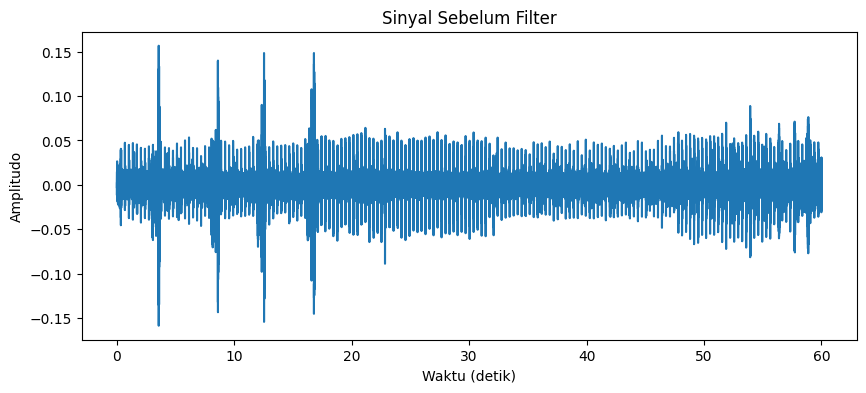

In [26]:
duration = len(data) / sample_rate
time = np.arange(0, duration, 1 / sample_rate)
plt.figure(figsize=(10, 4))
plt.plot(time, data)
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.title('Sinyal Sebelum Filter')
plt.show()

In [27]:
fft_data = fft(data)
freq = np.fft.fftfreq(len(data), 1 / sample_rate)
f_min = 1800  # Frekuensi minimum yang diinginkan (dalam Hz)
f_max = 8000  # Frekuensi maksimum yang diinginkan (dalam Hz)

fft_filtered = np.where((np.abs(freq) >= f_min) & (np.abs(freq) <= f_max), fft_data, 0)
filtered_data = ifft(fft_filtered).real

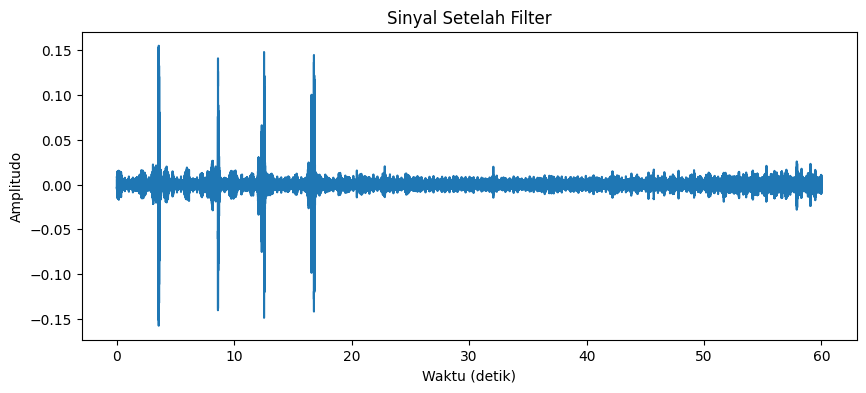

In [28]:
plt.figure(figsize=(10, 4))
plt.plot(time, filtered_data)
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.title('Sinyal Setelah Filter')
plt.show()

In [29]:
filtered_rekaman = 'rekaman_filtered.wav'
sf.write(filtered_rekaman, filtered_data, sample_rate)
print('File audio hasil filter disimpan:', filtered_rekaman)

File audio hasil filter disimpan: rekaman_filtered.wav


In [30]:
from IPython.display import Audio

print('Audio Sebelum Filter:')
Audio(rekaman)


Audio Sebelum Filter:


In [31]:
from IPython.display import Audio

print('Audio Setelah Filter:')
Audio(filtered_rekaman)

Audio Setelah Filter:
